# **Install and authenticate Kaggle API**

In [ ]:

!pip install -q kaggle

# Upload your kaggle.json (API token file)
from google.colab import files
files.upload()   # Upload kaggle.json from your Kaggle account

# Make a directory for Kaggle
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json


Saving kaggle.json to kaggle.json


# **Download the dataset from Kaggle**

In [ ]:

!kaggle datasets download -d akhatova/pcb-defects

# Unzip dataset
!unzip -q pcb-defects.zip -d ./pcb_defects


Dataset URL: https://www.kaggle.com/datasets/akhatova/pcb-defects
License(s): unknown
100% 1.87G/1.88G [00:23<00:00, 289MB/s]
100% 1.88G/1.88G [00:23<00:00, 84.1MB/s]


#**Importing the standard libraries**

In [ ]:

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import patches
import seaborn as sns
import os
import random
import re
import shutil
sns.set_style('darkgrid')
sns.set_palette('pastel')

import warnings
warnings.filterwarnings('ignore')


# **Understanding the dataset**

In [ ]:
input_dir= "pcb_defects/PCB_DATASET"
os.listdir(input_dir)

['images', 'rotate.py', 'rotation', 'PCB_USED', 'Annotations']

*  **PCB USED folder**- contains the 12 template images we used in the dataset.
* **images folder**- contains the PCB images subclassed into different types.
* **rotation folder**- contains the rotated PCB images subclassed into different types as well as rotation angle
* **annotations folder**- contains the annotations for bounding box of each images





# **Analyzing the PCB USED folder**

In [ ]:
template_dir=os.path.join(input_dir,'PCB_USED')
template_dir

'pcb_defects/PCB_DATASET/PCB_USED'

# **visualize images**

In [ ]:
def visualize_img(dir_name,nos_):
    k=1
    plt.figure(figsize=(8,(nos_//2)*6))
    for filename in os.listdir(dir_name)[0:nos_]:
        if filename.lower().endswith(('.jpg','.jpeg','.png')):
            ax=plt.subplot((nos_//2)+1,2,k)
            img_path=os.path.join(dir_name,filename)
            img=plt.imread(img_path)
            ax.imshow(img)
            ax.set_xlabel(filename)
            ax.grid(False)
            ax.set_xticks([])
            ax.set_yticks([])
            k+=1
    plt.tight_layout()
    plt.show()

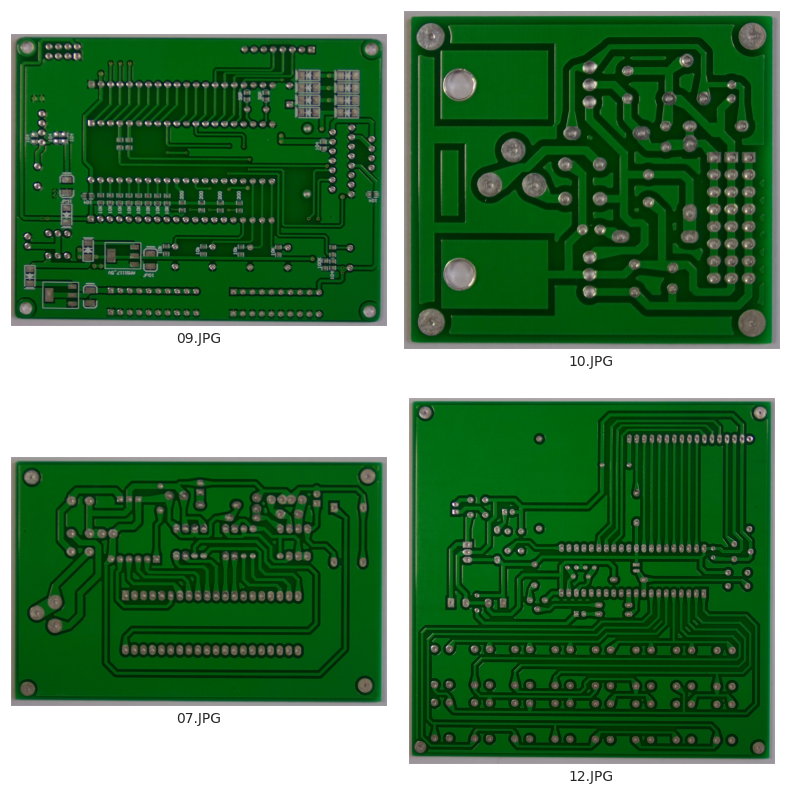

No of template images:10


In [ ]:
visualize_img(template_dir,nos_=4)

print(f'No of template images:{len(os.listdir(template_dir))}')

# **Analyzing the images folder**

In [ ]:

img_dir=os.path.join(input_dir,'images')

#Listing the types of defects
os.listdir(img_dir)
types_defect=os.listdir(os.path.join(input_dir,'images'))
types_defect

['Open_circuit',
 'Spur',
 'Short',
 'Missing_hole',
 'Mouse_bite',
 'Spurious_copper']

In [ ]:

img_path_list=[]
#Creating img_path list
for sub_cat in types_defect:
    for file in os.listdir(os.path.join(img_dir,sub_cat)):

        img_path_list.append(os.path.join(img_dir,sub_cat,file))


# **Vizualizing defect images for each type**

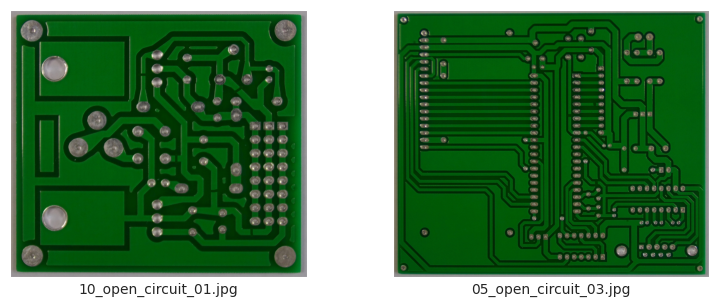

No of Open_circuit images:116


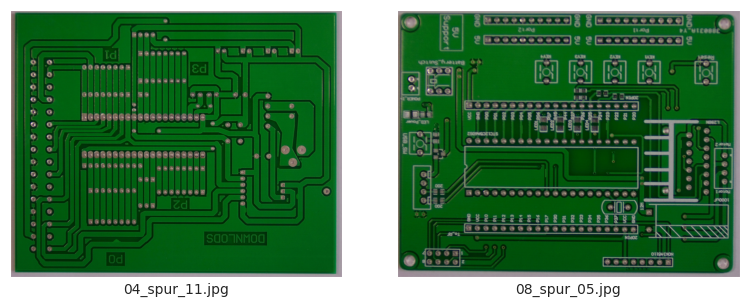

No of Spur images:115


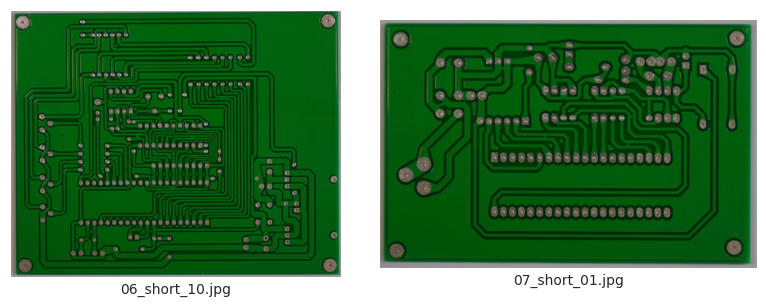

No of Short images:116


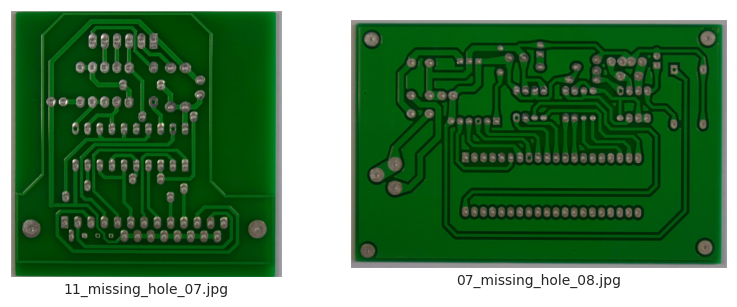

No of Missing_hole images:115


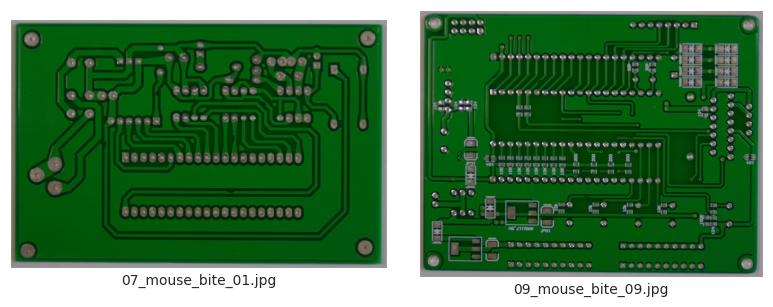

No of Mouse_bite images:115


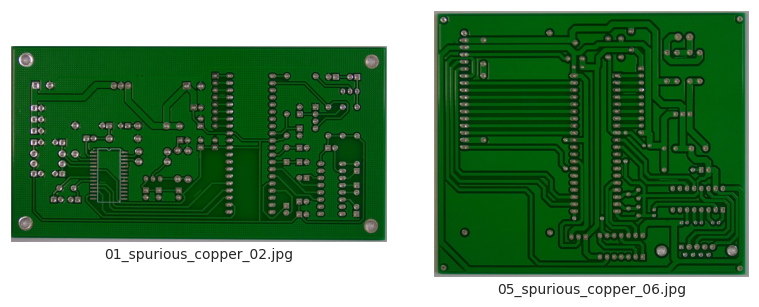

No of Spurious_copper images:116


In [ ]:

df_defect=pd.DataFrame(columns=['No of defect'])
for sub_cat in types_defect:
    visualize_img(os.path.join(img_dir,sub_cat),nos_=2)

    print(f'No of {sub_cat} images:{len(os.listdir(os.path.join(img_dir,sub_cat)))}')

    df_defect.loc[sub_cat]=len(os.listdir(os.path.join(img_dir,sub_cat)))


# **No. of defects by type**

In [ ]:

df_defect

,No of defect
Open_circuit,116
Spur,115
Short,116
Missing_hole,115
Mouse_bite,115
Spurious_copper,116


# **Analyzing rotated folder**

In [ ]:
rotated_dir=os.path.join(input_dir,'rotation')
os.listdir(rotated_dir)

['Missing_hole_rotation',
 'Open_circuit_rotation',
 'Spurious_copper_angles.txt',
 'Mouse_bite_angles.txt',
 'Spur_rotation',
 'Short_angles.txt',
 'Open_circuit_angles.txt',
 'Spurious_copper_rotation',
 'Mouse_bite_rotation',
 'Short_rotation',
 'Missing_hole_angles.txt',
 'Spur_angles.txt']

In [ ]:
rotated_angle_list=[j for j in os.listdir(rotated_dir) if j.endswith('.txt')]
rotated_angle_list

['Spurious_copper_angles.txt',
 'Mouse_bite_angles.txt',
 'Short_angles.txt',
 'Open_circuit_angles.txt',
 'Missing_hole_angles.txt',
 'Spur_angles.txt']

In [ ]:
types_defect_rotated=[j for j in os.listdir(rotated_dir) if j.endswith('.txt')==False]
types_defect_rotated

['Missing_hole_rotation',
 'Open_circuit_rotation',
 'Spur_rotation',
 'Spurious_copper_rotation',
 'Mouse_bite_rotation',
 'Short_rotation']

# **Vizualizing rotated defects**

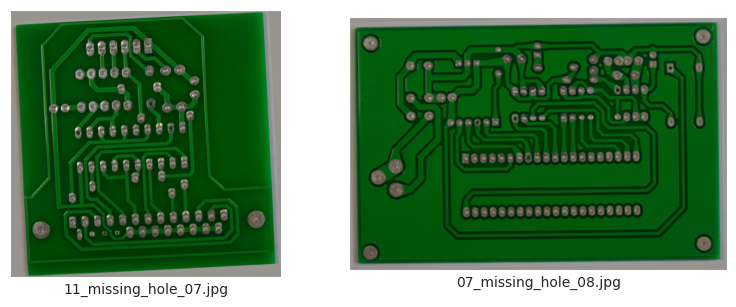

No of Missing_hole_rotation images:115


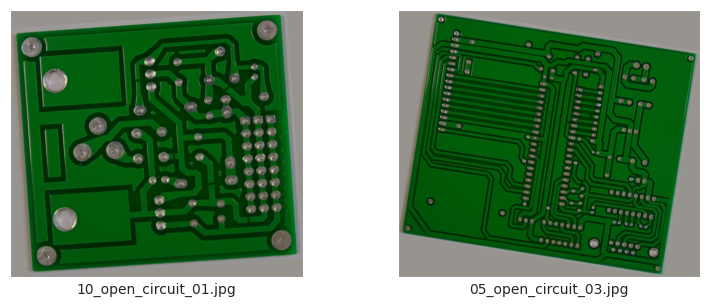

No of Open_circuit_rotation images:116


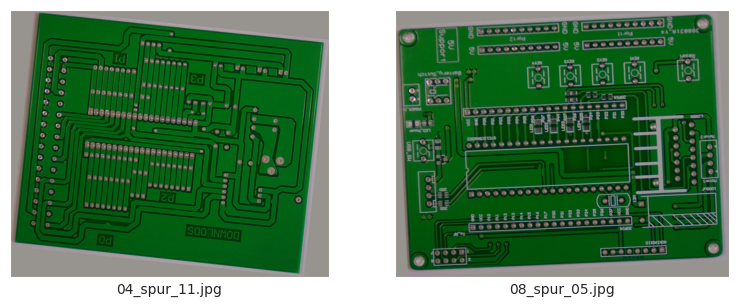

No of Spur_rotation images:115


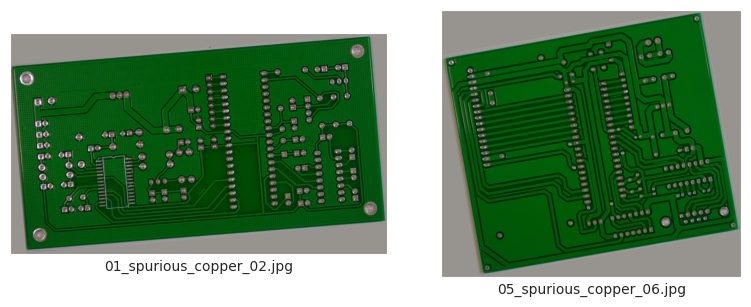

No of Spurious_copper_rotation images:116


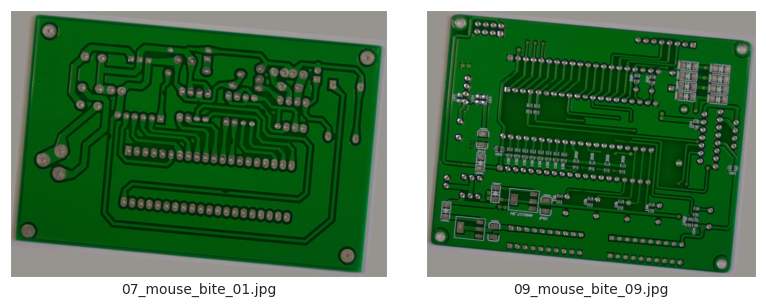

No of Mouse_bite_rotation images:115


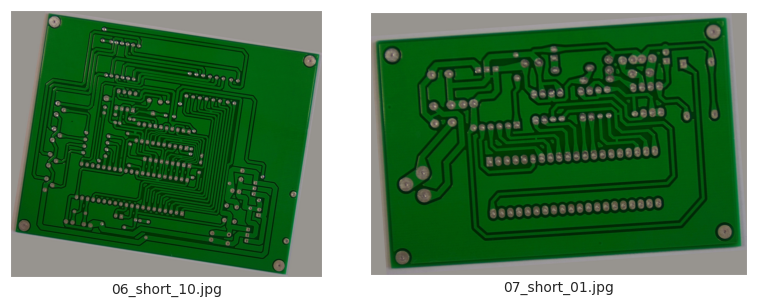

No of Short_rotation images:116


In [ ]:

df_defect_rotated=pd.DataFrame(columns=['No of defect'])
for sub_cat in types_defect_rotated:
    visualize_img(os.path.join(rotated_dir,sub_cat),nos_=2)

    print(f'No of {sub_cat} images:{len(os.listdir(os.path.join(rotated_dir,sub_cat)))}')

    df_defect_rotated.loc[sub_cat]=len(os.listdir(os.path.join(rotated_dir,sub_cat)))

# **No. of defects by type  rotated**

In [ ]:
df_defect_rotated

,No of defect
Missing_hole_rotation,115
Open_circuit_rotation,116
Spur_rotation,115
Spurious_copper_rotation,116
Mouse_bite_rotation,115
Short_rotation,116


# **Reading the rotation text files**

In [ ]:


df_rotation_angle=pd.DataFrame(columns=['Line','Angle'])
for filename in rotated_angle_list:
    with open(os.path.join(rotated_dir,filename),'r') as f:
        lines=f.readlines()
        for line in lines:
            text,angle=line.split()
            df_rotation_angle=pd.concat([df_rotation_angle,pd.DataFrame({'Line':[text],'Angle':[angle]})],axis=0)


In [ ]:
df_rotation_angle

,Line,Angle
0,04_spurious_copper_01,1
0,04_spurious_copper_20,-10
0,09_spurious_copper_05,1
0,01_spurious_copper_07,10
0,04_spurious_copper_15,-10
...,...,...
0,04_spur_10,-2
0,04_spur_18,5
0,04_spur_09,9
0,10_spur_02,2


# **Analyzing the annotate folder**

In [ ]:
annote_dir=os.path.join(input_dir,'Annotations')
annote_dir

'pcb_defects/PCB_DATASET/Annotations'

In [ ]:
type_annot=os.listdir(annote_dir)
type_annot

['Open_circuit',
 'Spur',
 'Short',
 'Missing_hole',
 'Mouse_bite',
 'Spurious_copper']

In [ ]:
df_annot_nos=pd.DataFrame(columns=['No of annotations'])

for i in type_annot:
    df_annot_nos.loc[i]=len(os.listdir(os.path.join(annote_dir,i)))
df_annot_nos

,No of annotations
Open_circuit,116
Spur,115
Short,116
Missing_hole,115
Mouse_bite,115
Spurious_copper,116


# **annotation file for each image**

In [ ]:
file_list=os.listdir(os.path.join(annote_dir,'Mouse_bite'))
file_list[0:5]

['11_mouse_bite_10.xml',
 '07_mouse_bite_07.xml',
 '12_mouse_bite_07.xml',
 '06_mouse_bite_08.xml',
 '04_mouse_bite_08.xml']

# **XML format, so we have to parse the data**

In [ ]:
import xml.etree.ElementTree as ET



In [ ]:
tree = ET.parse(os.path.join(os.path.join(annote_dir,'Mouse_bite'),'01_mouse_bite_11.xml'))
root = tree.getroot()

# **getting the structure of XML file**

In [ ]:

print(ET.tostring(root, encoding='utf8').decode('utf8'))

<?xml version='1.0' encoding='utf8'?>
<annotation>
	<folder>Mouse_bite</folder>
	<filename>01_mouse_bite_11.jpg</filename>
	<path>/home/weapon/Desktop/PCB_DATASET/Mouse_bite/01_mouse_bite_11.jpg</path>
	<source>
		<database>Unknown</database>
	</source>
	<size>
		<width>3034</width>
		<height>1586</height>
		<depth>3</depth>
	</size>
	<segmented>0</segmented>
	<object>
		<name>mouse_bite</name>
		<pose>Unspecified</pose>
		<truncated>0</truncated>
		<difficult>0</difficult>
		<bndbox>
			<xmin>1199</xmin>
			<ymin>966</ymin>
			<xmax>1234</xmax>
			<ymax>1004</ymax>
		</bndbox>
	</object>
	<object>
		<name>mouse_bite</name>
		<pose>Unspecified</pose>
		<truncated>0</truncated>
		<difficult>0</difficult>
		<bndbox>
			<xmin>2042</xmin>
			<ymin>755</ymin>
			<xmax>2073</xmax>
			<ymax>786</ymax>
		</bndbox>
	</object>
	<object>
		<name>mouse_bite</name>
		<pose>Unspecified</pose>
		<truncated>0</truncated>
		<difficult>0</difficult>
		<bndbox>
			<xmin>1472</xmin>
			<ymin>607</ymin>
		

# **Parsing XML to return Bounding box dimensions**

In [ ]:

def parse_xml(xml_file):

    data=[]

    tree = ET.parse(xml_file)
    root = tree.getroot()

    filename = root.find('filename').text
    width = int(root.find('size/width').text)
    height = int(root.find('size/height').text)
    for obj in root.findall('object'):
        name = obj.find('name').text
        xmin = int(obj.find('bndbox/xmin').text)
        ymin = int(obj.find('bndbox/ymin').text)
        xmax = int(obj.find('bndbox/xmax').text)
        ymax = int(obj.find('bndbox/ymax').text)

        data.append({
            'filename': filename,
            'width': width,
            'height': height,
            'class': name,
            'xmin': xmin,
            'ymin': ymin,
            'xmax': xmax,
            'ymax': ymax
        })

    return data

# **Retrieving data for all files**

In [ ]:

data=[]
all_data=[]

for x in type_annot:
    for file in os.listdir(os.path.join(annote_dir,x)):
        xml_file_path=os.path.join(os.path.join(annote_dir,x),file)
        data=parse_xml(xml_file_path)
        all_data.extend(data)


# **dataframe to store the annotations**

In [ ]:

df_annot=pd.DataFrame(all_data)
df_annot

,filename,width,height,class,xmin,ymin,xmax,ymax
0,06_open_circuit_10.jpg,2868,2316,open_circuit,1988,995,2020,1050
1,06_open_circuit_10.jpg,2868,2316,open_circuit,1299,1036,1351,1080
2,06_open_circuit_10.jpg,2868,2316,open_circuit,938,1319,977,1378
3,06_open_circuit_10.jpg,2868,2316,open_circuit,632,302,683,341
4,06_open_circuit_10.jpg,2868,2316,open_circuit,1368,325,1458,367
...,...,...,...,...,...,...,...,...
2948,05_spurious_copper_09.jpg,2544,2156,spurious_copper,2113,1592,2156,1712
2949,05_spurious_copper_09.jpg,2544,2156,spurious_copper,1399,1913,1563,1959
2950,01_spurious_copper_05.jpg,3034,1586,spurious_copper,537,985,637,1013
2951,01_spurious_copper_05.jpg,3034,1586,spurious_copper,740,1260,775,1332


In [ ]:
import os
import shutil

img_dir = "/content/pcb_defects/PCB_DATASET/images"

# Define the source directories for each category inside img_dir
source_dirs = [
    os.path.join(img_dir, "Missing_hole"),
    os.path.join(img_dir, "Mouse_bite"),
    os.path.join(img_dir, "Open_circuit"),
    os.path.join(img_dir, "Short"),
    os.path.join(img_dir, "Spur"),
    os.path.join(img_dir, "Spurious_copper")
]


destination_dir = "/content/images_combined"

os.makedirs(destination_dir, exist_ok=True)

for source_dir in source_dirs:
    if os.path.exists(source_dir):
        files = os.listdir(source_dir)

        for file in files:
            file_path = os.path.join(source_dir, file)
            if os.path.isfile(file_path):
                shutil.copy(file_path, destination_dir)
    else:
        print(f"Directory {source_dir} does not exist.")


files_in_combined = os.listdir(destination_dir)
print(f"Number of files copied: {len(files_in_combined)}")


Number of files copied: 693


In [ ]:
destination_dir

'/content/images_combined'

# **no of defects in each pcb**

Text(0.5, 0, 'No of defects in one PCB')

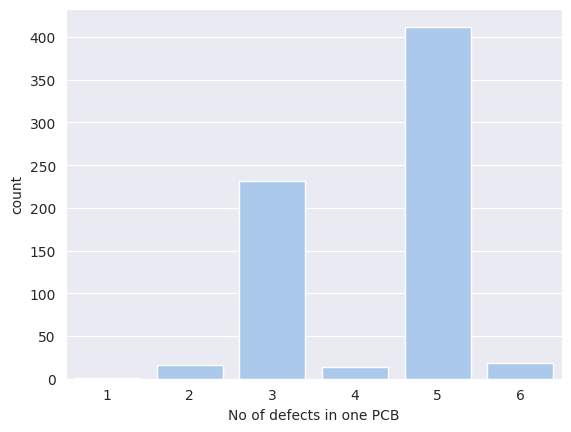

In [ ]:

df_multiple_defects=pd.DataFrame(df_annot['filename'].value_counts())
sns.countplot(df_multiple_defects,x='count')
plt.xlabel('No of defects in one PCB')

# **bounding box**

In [ ]:
#Defining a function to view image along with bounding box

def draw_bounding_boxes(image_path, bounding_boxes,annotation):
    """
    Draws multiple bounding boxes on an image using Matplotlib.

    Args:
        image_path: The path to the image file.
        bounding_boxes: A list of bounding boxes, each represented as a tuple or list containing
                       (min_x, min_y, max_x, max_y).
    """

    img = plt.imread(image_path)

    fig, ax = plt.subplots(figsize=(15,10))

    ax.imshow(img)

    for bbox in bounding_boxes:
        min_x, min_y, max_x, max_y = bbox
        width = max_x - min_x
        height = max_y - min_y
        rect = patches.Rectangle((min_x, min_y), width, height, linewidth=1, edgecolor='red', facecolor='none')
        ax.add_patch(rect)

        # Calculate the centroid of the bounding box
        centroid_x = (min_x + max_x) / 2
        centroid_y = (min_y + max_y) / 2

        ax.annotate( annotation,(centroid_x,centroid_y),(max_x+20,max_y+20),
            fontsize=10,color='white',
            horizontalalignment='right', verticalalignment='top')

    plt.grid(False)
    plt.xticks([])
    plt.yticks([])

    plt.show()


In [ ]:
filepath=img_path_list[0]
filename=re.sub(r'.+/([\w_]+\.jpg)',r'\1',filepath)
filename

'10_open_circuit_01.jpg'

In [ ]:
def visualize_annotations(list_image_path, df):
    for i in list_image_path:
        filepath = i
        filename = re.sub(r'.+/([\w_]+\.jpg)', r'\1', filepath)
        df_selected = df[df['filename'] == filename]
        width  = df_selected['width'].values
        height = df_selected['height'].values

        # check if 'class' or 'class_name' exists
        if 'class_name' in df_selected.columns:
            class_name = df_selected['class_name'].values
        elif 'class' in df_selected.columns:
            class_name = df_selected['class'].values
        else:
            raise KeyError("No class column found in dataframe")

        xmin = df_selected['xmin'].values
        ymin = df_selected['ymin'].values
        xmax = df_selected['xmax'].values
        ymax = df_selected['ymax'].values

        bbox = zip(xmin, ymin, xmax, ymax)
        draw_bounding_boxes(filepath, bbox, class_name[0])


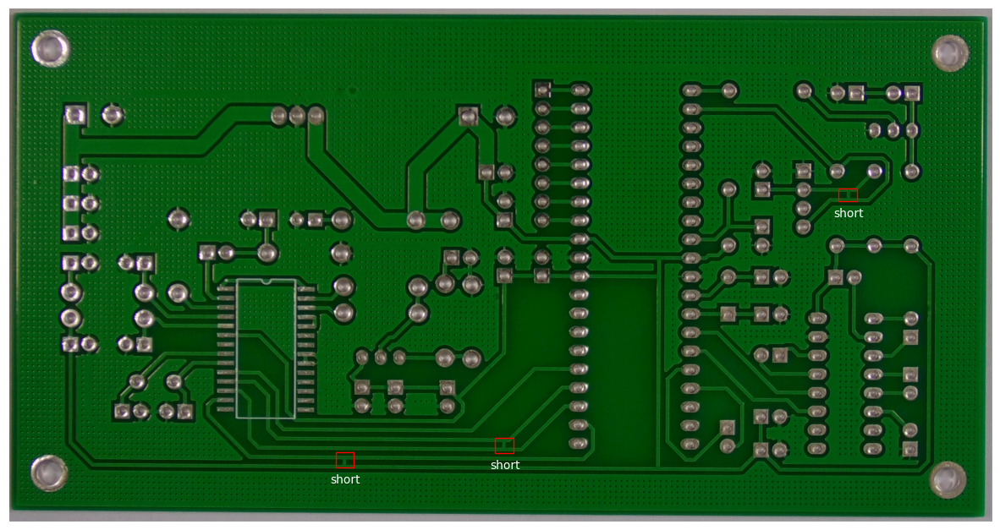

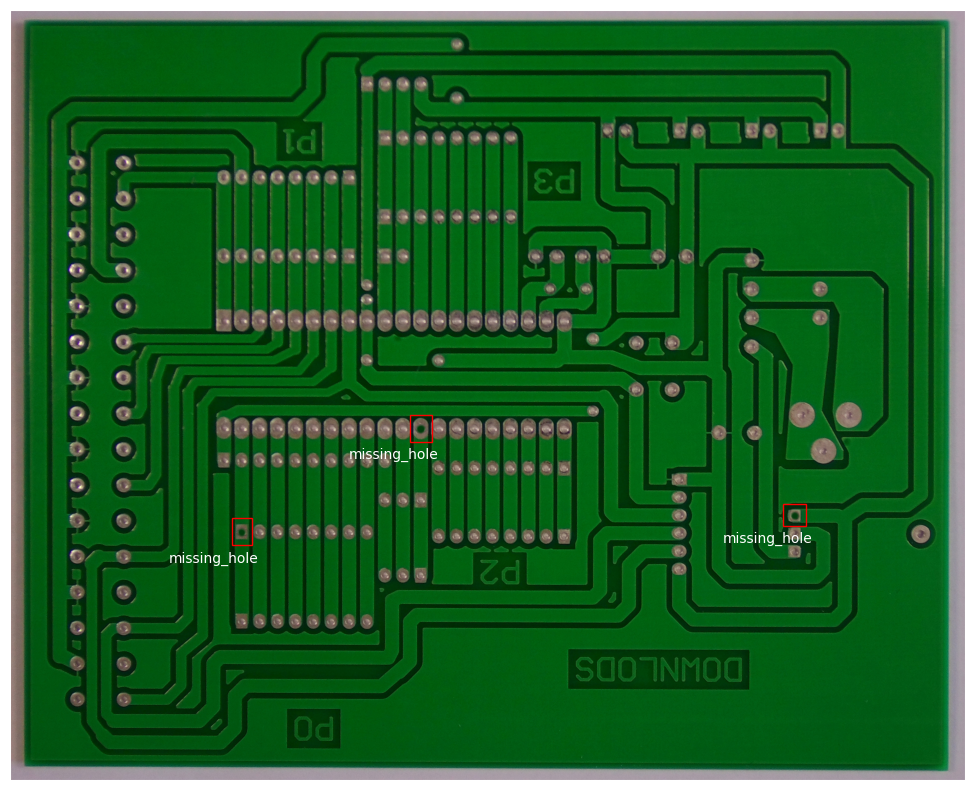

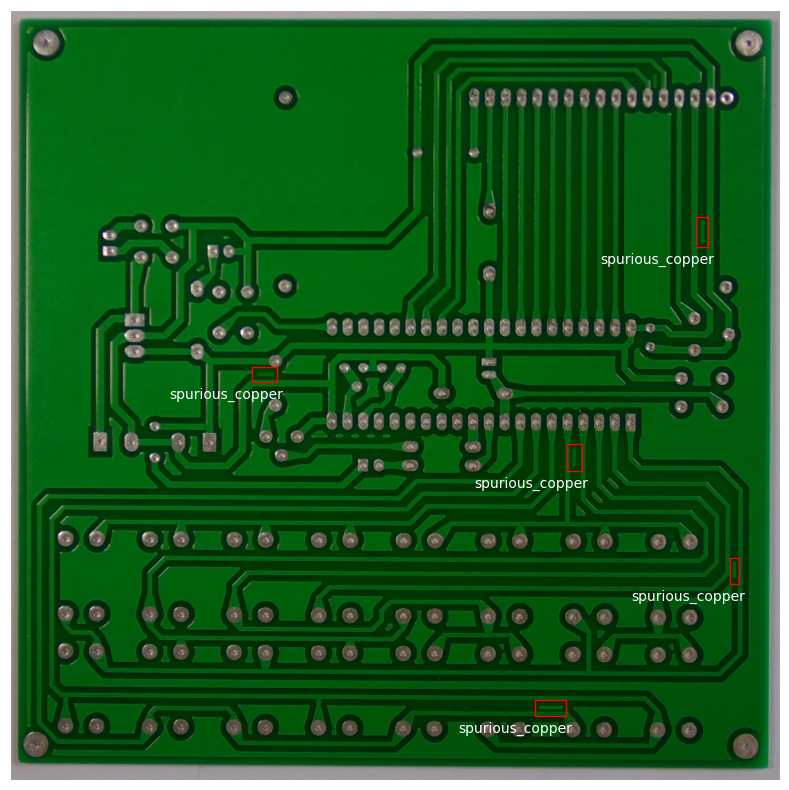

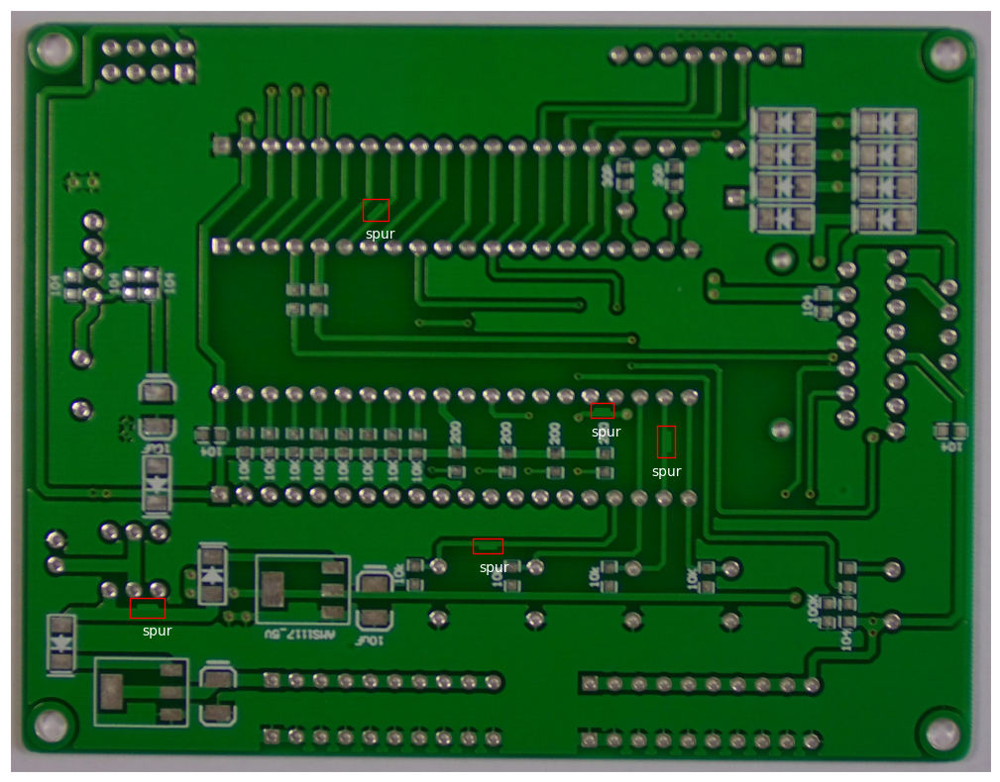

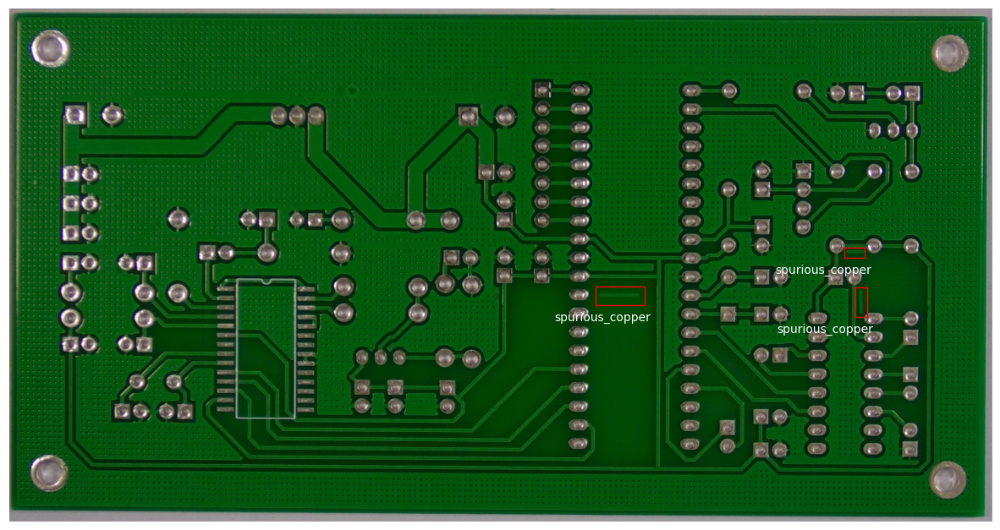

In [ ]:
image_path_shuffle=img_path_list
random.shuffle(image_path_shuffle)

visualize_annotations(image_path_shuffle[0:5],df_annot)

In [ ]:

# IMPORTING LIBRARIES AND CONFIGURATION
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torchvision import models, transforms, utils

from PIL import Image
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
import time
import copy
import os

print("PyTorch Version:", torch.__version__)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")


PyTorch Version: 2.9.0+cu126
Using device: cuda


Preview of the provided annotation DataFrame:
                 filename  width  height    class_name  xmin  ymin  xmax  ymax
0  06_open_circuit_10.jpg   2868    2316  open_circuit  1988   995  2020  1050
1  06_open_circuit_10.jpg   2868    2316  open_circuit  1299  1036  1351  1080
2  06_open_circuit_10.jpg   2868    2316  open_circuit   938  1319   977  1378
3  06_open_circuit_10.jpg   2868    2316  open_circuit   632   302   683   341
4  06_open_circuit_10.jpg   2868    2316  open_circuit  1368   325  1458   367

6 classes detected in the DataFrame: ['missing_hole', 'mouse_bite', 'open_circuit', 'short', 'spur', 'spurious_copper']
Number of defects - Training: 2079, Validation: 430, Test: 444

Visualizing a batch of cropped defect patches...


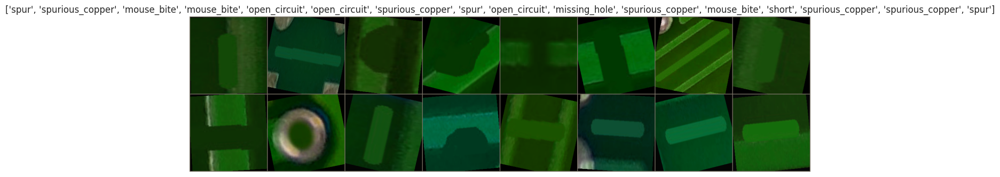

In [ ]:
# DATA PREPARATION (using df_annot and img_dir)

img_dir = destination_dir


if 'class' in df_annot.columns:
    df_annot = df_annot.rename(columns={'class': 'class_name'})

print("Preview of the provided annotation DataFrame:")
print(df_annot.head())


class_names = sorted(df_annot['class_name'].unique())
num_classes = len(class_names)
print(f"\n{num_classes} classes detected in the DataFrame: {class_names}")


unique_filenames = df_annot['filename'].unique()
train_files, test_val_files = train_test_split(unique_filenames, test_size=0.3, random_state=42)
val_files, test_files = train_test_split(test_val_files, test_size=0.5, random_state=42) # 0.3 * 0.5 = 0.15

train_df = df_annot[df_annot['filename'].isin(train_files)].reset_index(drop=True)
val_df = df_annot[df_annot['filename'].isin(val_files)].reset_index(drop=True)
test_df = df_annot[df_annot['filename'].isin(test_files)].reset_index(drop=True)

dataset_sizes = {'train': len(train_df), 'val': len(val_df), 'test': len(test_df)}
print(f"Number of defects - Training: {dataset_sizes['train']}, Validation: {dataset_sizes['val']}, Test: {dataset_sizes['test']}")

data_transforms = {
    'train': transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.RandomHorizontalFlip(),
        transforms.RandomRotation(15),
        transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

class PCBCropDataset(Dataset):
    def __init__(self, dataframe, image_dir, class_names, transform=None):
        self.df = dataframe
        self.image_dir = image_dir
        self.transform = transform
        self.class_to_idx = {cls_name: i for i, cls_name in enumerate(class_names)}

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img_filename = row['filename']
        box = (row['xmin'], row['ymin'], row['xmax'], row['ymax'])
        label_idx = self.class_to_idx[row['class_name']]

        try:
            img_path = os.path.join(self.image_dir, img_filename)
            image = Image.open(img_path).convert('RGB')
            cropped_image = image.crop(box)
        except FileNotFoundError:
            print(f"Warning: File not found {img_path}. Returning an empty tensor.")
            return torch.zeros((3, 224, 224)), -1

        if self.transform:
            cropped_image = self.transform(cropped_image)

        return cropped_image, label_idx

train_dataset = PCBCropDataset(train_df, img_dir, class_names, transform=data_transforms['train'])
val_dataset = PCBCropDataset(val_df, img_dir, class_names, transform=data_transforms['val'])
test_dataset = PCBCropDataset(test_df, img_dir, class_names, transform=data_transforms['val'])


batch_size = 16

dataloaders = {
    'train': DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=os.cpu_count()),
    'val': DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=os.cpu_count()),
    'test': DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=os.cpu_count())
}


print("\nVisualizing a batch of cropped defect patches...")
inputs, classes_idx = next(iter(dataloaders['train']))
out = utils.make_grid(inputs)

def imshow(inp, title=None):
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406]); std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean; inp = np.clip(inp, 0, 1)
    plt.figure(figsize=(15, 8)); plt.imshow(inp)
    if title is not None: plt.title(title)
    plt.axis('off'); plt.show()

imshow(out, title=[class_names[x] for x in classes_idx])

# **Pretrained ResNet Model**

In [ ]:
#  PRETRAINED MODEL (ResNet18 - most performant approach)

def get_pretrained_model(num_classes):
    model = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
    for param in model.parameters():
        param.requires_grad = False


    num_ftrs = model.fc.in_features
    model.fc = nn.Linear(num_ftrs, num_classes)

    return model.to(device)

In [ ]:
#  TRAINING AND VALIDATION FUNCTION

def train_model(model, criterion, optimizer, num_epochs=25, patience=5):
    since = time.time()
    history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': []}

    best_model_wts = copy.deepcopy(model.state_dict())
    best_loss = float('inf')
    epochs_no_improve = 0

    for epoch in range(num_epochs):
        print(f'Epoch {epoch+1}/{num_epochs}' + ' | ' + '-'*10)
        for phase in ['train', 'val']:
            model.train() if phase == 'train' else model.eval()
            running_loss, running_corrects = 0.0, 0

            for inputs, labels in dataloaders[phase]:
                inputs, labels = inputs.to(device), labels.to(device)
                optimizer.zero_grad()
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    loss = criterion(outputs, labels)
                    _, preds = torch.max(outputs, 1)
                    if phase == 'train':
                        loss.backward(); optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]
            print(f'{phase.capitalize()} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

            history[f'{phase}_loss'].append(epoch_loss)
            history[f'{phase}_acc'].append(epoch_acc.item())

            if phase == 'val':
                if epoch_loss < best_loss:
                    print(f"Validation loss improved ({best_loss:.4f} -> {epoch_loss:.4f}). Saving model...")
                    best_loss = epoch_loss
                    best_model_wts = copy.deepcopy(model.state_dict())
                    epochs_no_improve = 0
                else:
                    epochs_no_improve += 1

        if epochs_no_improve >= patience:
            print(f"\nEarly stopping triggered after {patience} epochs with no improvement.")
            break
        print()

    time_elapsed = time.time() - since
    print(f'Training complete in {time_elapsed//60:.0f}m {time_elapsed%60:.0f}s')
    print(f'Best Validation Loss: {best_loss:4f}')

    model.load_state_dict(best_model_wts)
    return model, history


In [ ]:
#  TRAINING EXECUTION

if torch.cuda.is_available():
    pass

resnet_model = get_pretrained_model(num_classes)


criterion = nn.CrossEntropyLoss()

optimizer = optim.Adam(filter(lambda p: p.requires_grad, resnet_model.parameters()), lr=0.001)


best_resnet_model, history = train_model(resnet_model, criterion, optimizer, num_epochs=5, patience=5)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 194MB/s]


Epoch 1/5 | ----------
Train Loss: 1.2371 Acc: 0.5421
Val Loss: 1.0224 Acc: 0.6465
Validation loss improved (inf -> 1.0224). Saving model...

Epoch 2/5 | ----------
Train Loss: 0.8082 Acc: 0.7427
Val Loss: 0.7672 Acc: 0.7605
Validation loss improved (1.0224 -> 0.7672). Saving model...

Epoch 3/5 | ----------
Train Loss: 0.6717 Acc: 0.7917
Val Loss: 0.5517 Acc: 0.8326
Validation loss improved (0.7672 -> 0.5517). Saving model...

Epoch 4/5 | ----------
Train Loss: 0.5912 Acc: 0.8033
Val Loss: 0.5162 Acc: 0.8465
Validation loss improved (0.5517 -> 0.5162). Saving model...

Epoch 5/5 | ----------
Train Loss: 0.5301 Acc: 0.8369
Val Loss: 0.4743 Acc: 0.8349
Validation loss improved (0.5162 -> 0.4743). Saving model...

Training complete in 11m 24s
Best Validation Loss: 0.474298


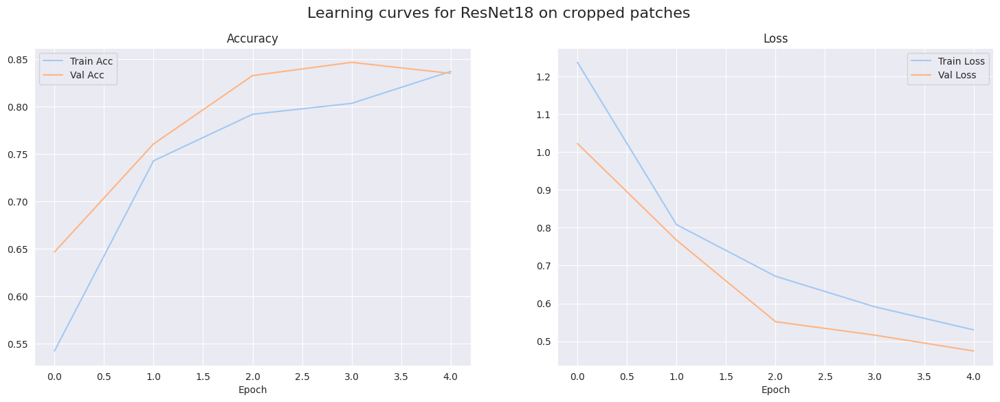

In [ ]:
#  ANALYSIS AND EVALUATION OF RESULTS

def plot_history(history, model_name):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))
    fig.suptitle(f"Learning curves for {model_name}", fontsize=16)
    ax1.plot(history['train_acc'], label='Train Acc'); ax1.plot(history['val_acc'], label='Val Acc')
    ax1.set_title('Accuracy'); ax1.set_xlabel('Epoch'); ax1.legend(); ax1.grid(True)
    ax2.plot(history['train_loss'], label='Train Loss'); ax2.plot(history['val_loss'], label='Val Loss')
    ax2.set_title('Loss'); ax2.set_xlabel('Epoch'); ax2.legend(); ax2.grid(True)
    plt.show()

plot_history(history, "ResNet18 on cropped patches")



# **Evaluation on the test set**


--- Final evaluation of model 'ResNet18' on the Test Set ---

                 precision    recall  f1-score   support

   missing_hole     0.9062    1.0000    0.9508        58
     mouse_bite     0.8765    0.8765    0.8765        81
   open_circuit     0.8000    0.9670    0.8756        91
          short     1.0000    0.7500    0.8571        68
           spur     0.7941    0.7714    0.7826        70
spurious_copper     0.8857    0.8158    0.8493        76

       accuracy                         0.8649       444
      macro avg     0.8771    0.8635    0.8653       444
   weighted avg     0.8722    0.8649    0.8636       444



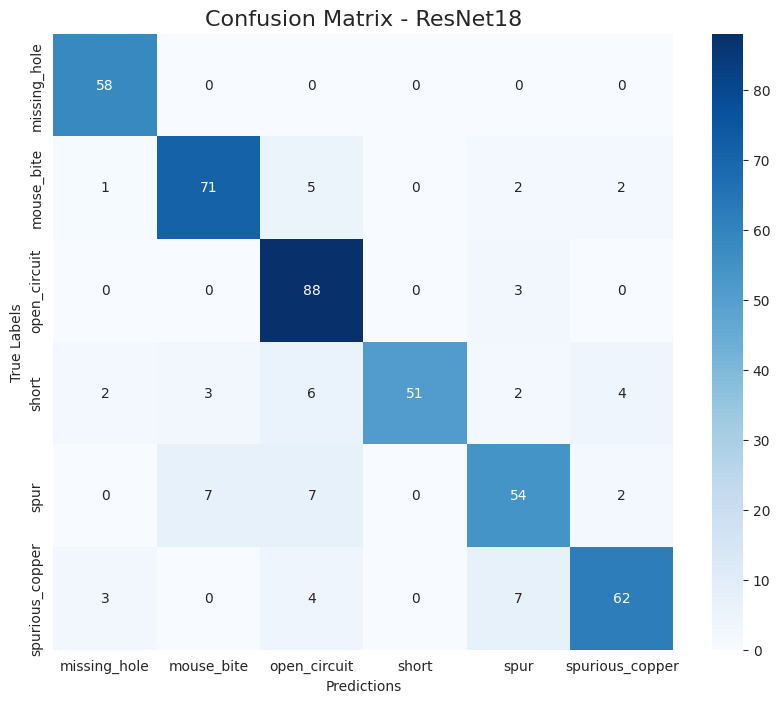

In [ ]:
def evaluate_model(model, dataloader, model_name):
    model.eval()
    y_true, y_pred = [], []
    with torch.no_grad():
        for inputs, labels in dataloader:
            outputs = model(inputs.to(device))
            _, predicted = torch.max(outputs, 1)
            y_true.extend(labels.numpy())
            y_pred.extend(predicted.cpu().numpy())

    print(f"\n--- Final evaluation of model '{model_name}' on the Test Set ---\n")
    print(classification_report(y_true, y_pred, target_names=class_names, digits=4))

    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
    plt.title(f'Confusion Matrix - {model_name}', fontsize=16)
    plt.xlabel('Predictions'); plt.ylabel('True Labels')
    plt.show()

evaluate_model(best_resnet_model, dataloaders['test'], "ResNet18")


# **Test the model on a single image**

In [ ]:
RESNET_MODEL_PATH = "/content/resnet18_trained.pth"

torch.save(best_resnet_model.state_dict(), RESNET_MODEL_PATH)

print(f" Trained ResNet18 weights saved at: {RESNET_MODEL_PATH}")


 Trained ResNet18 weights saved at: /content/resnet18_trained.pth


# **SAVE THE TRAINED RESNET18 MODEL**

In [ ]:

def test_single_prediction(model, test_loader, class_names):
    model.eval()

    # Get one batch from test loader
    inputs, labels = next(iter(test_loader))
    inputs = inputs.to(device)
    labels = labels.to(device)

    with torch.no_grad():
        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)

    # Get first image from batch
    sample_input = inputs[0]
    actual_label = labels[0].item()
    predicted_label = preds[0].item()
    confidence = torch.softmax(outputs[0], dim=0)[predicted_label].item()

    return sample_input, actual_label, predicted_label, confidence

sample_input, actual, predicted, confidence = test_single_prediction(best_resnet_model, dataloaders['test'], class_names)
print(f"Actual: {class_names[actual]}")
print(f"Predicted: {class_names[predicted]}")
print(f"Confidence: {confidence:.4f}")


Actual: open_circuit
Predicted: open_circuit
Confidence: 0.8690


 # **YOLO-style**

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 129MB/s]


Starting YOLO-style training...
Epoch 1/5 | ----------
Train Loss: 1.3705 Acc: 0.4180
Val Loss: 0.9553 Acc: 0.7279
Validation loss improved (inf -> 0.9553). Saving model...

Epoch 2/5 | ----------
Train Loss: 1.0081 Acc: 0.5916
Val Loss: 0.6373 Acc: 0.8070
Validation loss improved (0.9553 -> 0.6373). Saving model...

Epoch 3/5 | ----------
Train Loss: 0.8607 Acc: 0.6715
Val Loss: 0.5802 Acc: 0.7977
Validation loss improved (0.6373 -> 0.5802). Saving model...

Epoch 4/5 | ----------
Train Loss: 0.8230 Acc: 0.6845
Val Loss: 0.5078 Acc: 0.8488
Validation loss improved (0.5802 -> 0.5078). Saving model...

Epoch 5/5 | ----------
Train Loss: 0.7357 Acc: 0.7244
Val Loss: 0.5054 Acc: 0.8256
Validation loss improved (0.5078 -> 0.5054). Saving model...

Training complete in 11m 14s
Best Validation Loss: 0.505396

--- YOLO-style Model Evaluation ---

--- Final evaluation of model 'YOLO-style Model' on the Test Set ---

                 precision    recall  f1-score   support

   missing_hole     

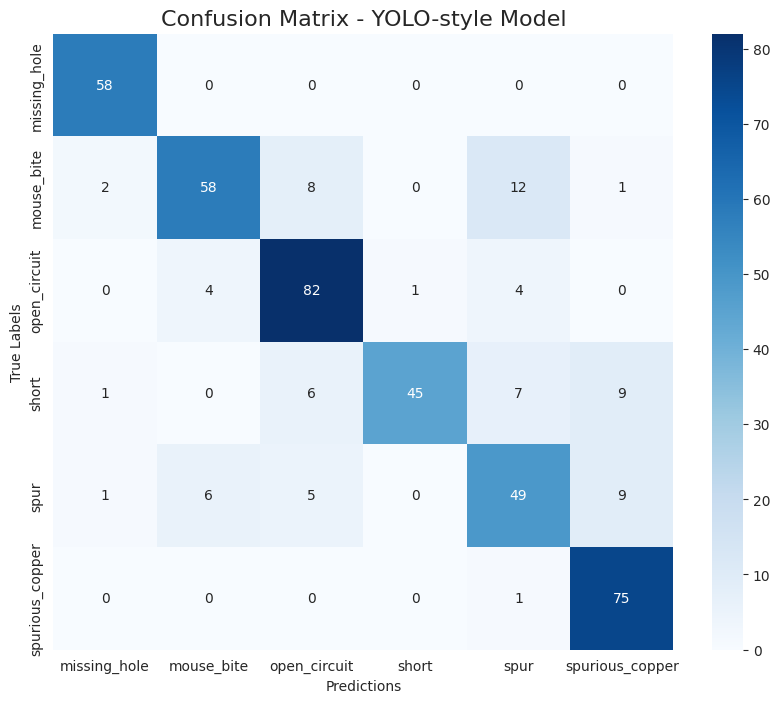

 YOLO-style model saved at: /content/yolo_model.pth


In [ ]:
import torch
from torchvision import models
import torch.nn as nn
import torch.optim as optim

if torch.cuda.is_available():
    torch.cuda.empty_cache()

yolo_model = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V1)
for param in yolo_model.parameters():
    param.requires_grad = False

num_ftrs = yolo_model.fc.in_features
yolo_model.fc = nn.Sequential(
    nn.Linear(num_ftrs, 512),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(512, 256),
    nn.ReLU(),
    nn.Dropout(0.3),
    nn.Linear(256, num_classes)
)
yolo_model = yolo_model.to(device)

optimizer_yolo = optim.Adam(filter(lambda p: p.requires_grad, yolo_model.parameters()), lr=0.001)

print("Starting YOLO-style training...")
best_yolo_model, history_yolo = train_model(yolo_model, criterion, optimizer_yolo, num_epochs=5, patience=5)

print("\n--- YOLO-style Model Evaluation ---")
evaluate_model(best_yolo_model, dataloaders['test'], "YOLO-style Model")

torch.save(best_yolo_model.state_dict(), "/content/yolo_model.pth")
print(" YOLO-style model saved at: /content/yolo_model.pth")


# **Model Performance Comparison**


MODEL PERFORMANCE COMPARISON TABLE (ResNet18 vs YOLO)
   Model  Accuracy  Precision   Recall  F1-Score
ResNet18  0.864865   0.872219 0.864865  0.863616
    YOLO  0.826577   0.836428 0.826577  0.823359


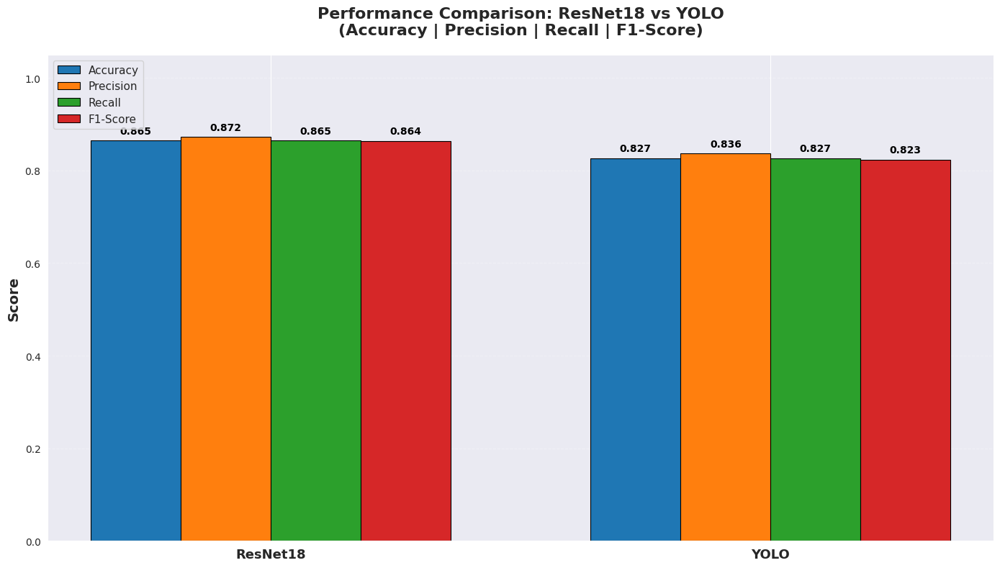


 Comparison chart saved at: /content/resnet18_vs_yolo_comparison.png

 Best Performing Model: ResNet18 with 86.49% accuracy


In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch

def get_comprehensive_metrics(model, test_loader, model_name):
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for inputs, labels in test_loader:
            outputs = model(inputs.to(device))
            _, preds = torch.max(outputs, 1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.numpy())

    accuracy = accuracy_score(all_labels, all_preds)
    precision = precision_score(all_labels, all_preds, average='weighted', zero_division=0)
    recall = recall_score(all_labels, all_preds, average='weighted', zero_division=0)
    f1 = f1_score(all_labels, all_preds, average='weighted', zero_division=0)

    return {
        'Model': model_name,
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1-Score': f1
    }

# Get metrics for only ResNet18 and YOLO models
resnet_metrics = get_comprehensive_metrics(best_resnet_model, dataloaders['test'], 'ResNet18')
yolo_metrics = get_comprehensive_metrics(best_yolo_model, dataloaders['test'], 'YOLO')

models_data = [resnet_metrics, yolo_metrics]
df = pd.DataFrame(models_data)

print("\n" + "="*60)
print("MODEL PERFORMANCE COMPARISON TABLE (ResNet18 vs YOLO)")
print("="*60)
print(df.to_string(index=False))
print("="*60)

# Create FIXED comparison chart - 4 CLEAR bars per model
model_names = df['Model'].tolist()
metrics_data = {
    'Accuracy': df['Accuracy'].tolist(),
    'Precision': df['Precision'].tolist(),
    'Recall': df['Recall'].tolist(),
    'F1-Score': df['F1-Score'].tolist()
}

x = np.arange(len(model_names))  # [0, 1] for 2 models
width = 0.18  # Narrower bars for 4 per model

fig, ax = plt.subplots(figsize=(14, 8))

# Beautiful color palette
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']  # Blue, Orange, Green, Red

# Plot 4 metrics side by side for each model
offset = [-1.5*width, -0.5*width, 0.5*width, 1.5*width]
metric_names = ['Accuracy', 'Precision', 'Recall', 'F1-Score']

for i, (metric, color) in enumerate(zip(metric_names, colors)):
    bars = ax.bar(x + offset[i], metrics_data[metric], width,
                  label=metric, color=color, edgecolor='black', linewidth=0.8)

    # Add value labels
    for bar, val in zip(bars, metrics_data[metric]):
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height + 0.01,
                f'{height:.3f}', ha='center', va='bottom',
                fontsize=10, fontweight='bold', color='black')

ax.set_ylabel('Score', fontsize=14, fontweight='bold')
ax.set_title('Performance Comparison: ResNet18 vs YOLO\n(Accuracy | Precision | Recall | F1-Score)',
             fontsize=16, fontweight='bold', pad=20)
ax.set_xticks(x)
ax.set_xticklabels(model_names, fontsize=13, fontweight='bold')
ax.legend(fontsize=11, loc='upper left', bbox_to_anchor=(0, 1))
ax.set_ylim(0, 1.05)
ax.grid(axis='y', alpha=0.3, linestyle='--')

# Improve layout
plt.tight_layout()
plt.savefig('/content/resnet18_vs_yolo_comparison.png', dpi=300, bbox_inches='tight',
            facecolor='white')
plt.show()

print("\n Comparison chart saved at: /content/resnet18_vs_yolo_comparison.png")

# Find best model
best_model_idx = df['Accuracy'].idxmax()
best_model = df.loc[best_model_idx, 'Model']
best_accuracy = df.loc[best_model_idx, 'Accuracy']

print(f"\n Best Performing Model: {best_model} with {best_accuracy*100:.2f}% accuracy")
print("="*60)


# **Fine-Tuning ResNet18**


--- Start of Fine-Tuning ResNet18 ---
ResNet18 model prepared for fine-tuning.
Epoch 1/5 | ----------
Train Loss: 0.9914 Acc: 0.6647
Val Loss: 0.4898 Acc: 0.8465
Validation loss improved (inf -> 0.4898). Saving model...

Epoch 2/5 | ----------
Train Loss: 0.2817 Acc: 0.9331
Val Loss: 0.2262 Acc: 0.9279
Validation loss improved (0.4898 -> 0.2262). Saving model...

Epoch 3/5 | ----------
Train Loss: 0.1549 Acc: 0.9562
Val Loss: 0.1428 Acc: 0.9558
Validation loss improved (0.2262 -> 0.1428). Saving model...

Epoch 4/5 | ----------
Train Loss: 0.1064 Acc: 0.9702
Val Loss: 0.1263 Acc: 0.9605
Validation loss improved (0.1428 -> 0.1263). Saving model...

Epoch 5/5 | ----------
Train Loss: 0.0825 Acc: 0.9774
Val Loss: 0.0994 Acc: 0.9698
Validation loss improved (0.1263 -> 0.0994). Saving model...

Training complete in 11m 5s
Best Validation Loss: 0.099354

--- Evaluation of the Fine-Tuned ResNet18 Model ---

--- Final evaluation of model 'ResNet18 (Fine-Tuned)' on the Test Set ---

          

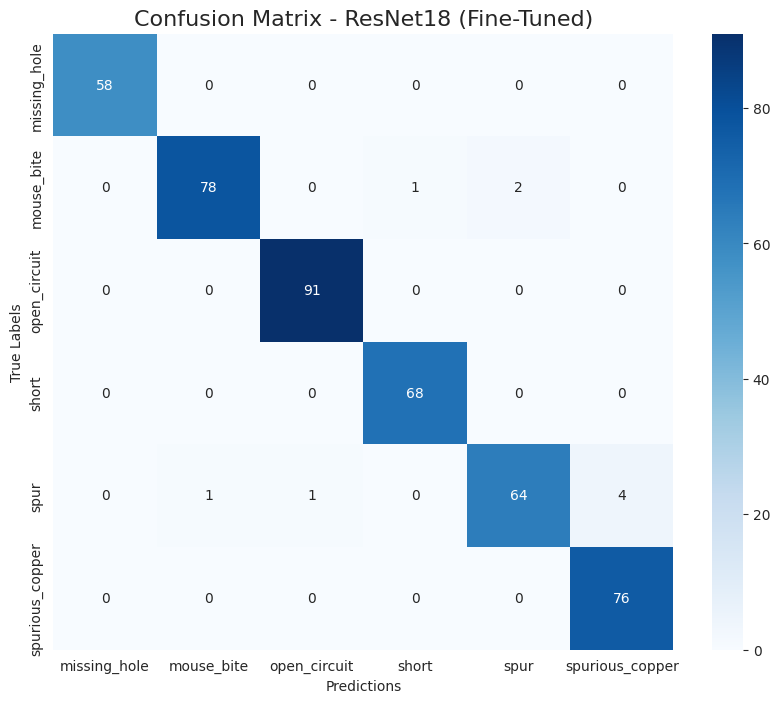

In [ ]:
print("\n--- Start of Fine-Tuning ResNet18 ---")

if torch.cuda.is_available():
    torch.cuda.empty_cache()

#  Reload the pre-trained model
finetune_model = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)

#  Unfreeze the last layers. For example, the last two blocks
for name, param in finetune_model.named_parameters():
    if "layer3" in name or "layer4" in name or "fc" in name:
        param.requires_grad = True
    else:
        param.requires_grad = False

#  Replace the classification head
num_ftrs = finetune_model.fc.in_features
finetune_model.fc = nn.Linear(num_ftrs, num_classes)
finetune_model = finetune_model.to(device)

#  Create an optimizer with different learning rates
optimizer_finetune = optim.Adam([
    {'params': finetune_model.fc.parameters(), 'lr': 1e-3},
    {'params': finetune_model.layer4.parameters(), 'lr': 1e-5},
    {'params': finetune_model.layer3.parameters(), 'lr': 1e-5}
])

print("ResNet18 model prepared for fine-tuning.")

# Launch training with the same function
best_finetune_model, history_finetune = train_model(
    finetune_model,
    criterion,
    optimizer_finetune,
    num_epochs=5,
    patience=5
)

#  Evaluate the fine-tuned model
print("\n--- Evaluation of the Fine-Tuned ResNet18 Model ---")
evaluate_model(best_finetune_model, dataloaders['test'], "ResNet18 (Fine-Tuned)")



MODEL PERFORMANCE COMPARISON TABLE (3 Models)
              Model  Accuracy  Precision   Recall  F1-Score
           ResNet18  0.864865   0.872219 0.864865  0.863616
               YOLO  0.826577   0.836428 0.826577  0.823359
Fine-tuned ResNet18  0.979730   0.979907 0.979730  0.979538


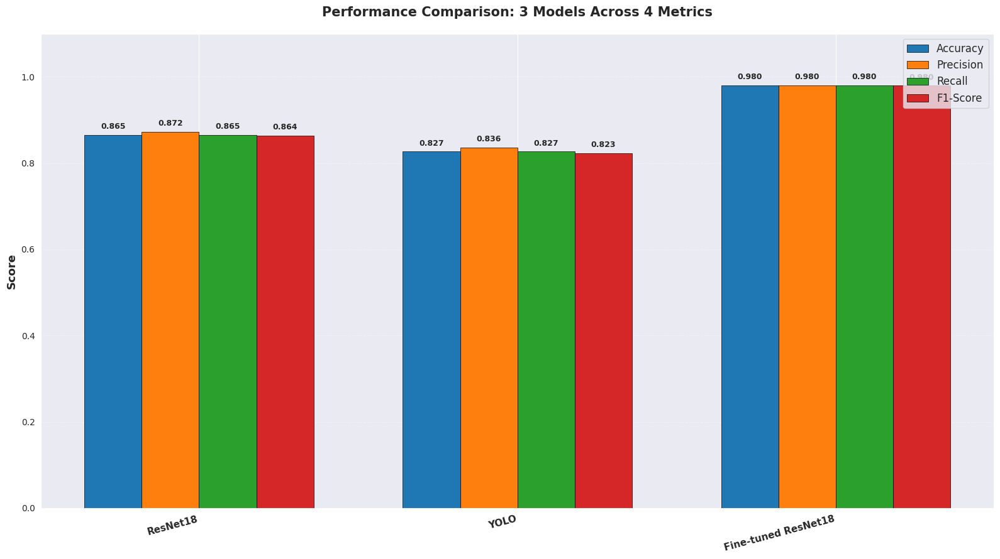


Comparison chart saved at: /content/3_models_comparison.png

 Best Performing Model: Fine-tuned ResNet18 with 97.97% accuracy


In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

def get_comprehensive_metrics(model, test_loader, model_name):
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for inputs, labels in test_loader:
            outputs = model(inputs.to(device))
            _, preds = torch.max(outputs, 1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.numpy())

    accuracy = accuracy_score(all_labels, all_preds)
    precision = precision_score(all_labels, all_preds, average='weighted', zero_division=0)
    recall = recall_score(all_labels, all_preds, average='weighted', zero_division=0)
    f1 = f1_score(all_labels, all_preds, average='weighted', zero_division=0)

    return {
        'Model': model_name,
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1-Score': f1
    }

# Get metrics for ONLY 3 models: ResNet18, YOLO, Fine-tuned ResNet18
resnet_metrics = get_comprehensive_metrics(best_resnet_model, dataloaders['test'], 'ResNet18')
yolo_metrics = get_comprehensive_metrics(best_yolo_model, dataloaders['test'], 'YOLO')
finetuned_resnet_metrics = get_comprehensive_metrics(best_finetune_model, dataloaders['test'], 'Fine-tuned ResNet18')

models_data = [resnet_metrics, yolo_metrics, finetuned_resnet_metrics]
df = pd.DataFrame(models_data)

print("\n" + "="*80)
print("MODEL PERFORMANCE COMPARISON TABLE (3 Models)")
print("="*80)
print(df.to_string(index=False))
print("="*80)

# Create comparison chart for 3 models
model_names = df['Model'].tolist()
accuracies = df['Accuracy'].tolist()
precisions = df['Precision'].tolist()
recalls = df['Recall'].tolist()
f1_scores = df['F1-Score'].tolist()

x = np.arange(len(model_names))
width = 0.18

fig, ax = plt.subplots(figsize=(16, 9))

# Professional color palette
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']

bars1 = ax.bar(x - 1.5*width, accuracies, width, label='Accuracy', color=colors[0], edgecolor='black', linewidth=0.5)
bars2 = ax.bar(x - 0.5*width, precisions, width, label='Precision', color=colors[1], edgecolor='black', linewidth=0.5)
bars3 = ax.bar(x + 0.5*width, recalls, width, label='Recall', color=colors[2], edgecolor='black', linewidth=0.5)
bars4 = ax.bar(x + 1.5*width, f1_scores, width, label='F1-Score', color=colors[3], edgecolor='black', linewidth=0.5)

ax.set_ylabel('Score', fontsize=13, fontweight='bold')
ax.set_title('Performance Comparison: 3 Models Across 4 Metrics', fontsize=15, fontweight='bold', pad=20)
ax.set_xticks(x)
ax.set_xticklabels(model_names, fontsize=11, rotation=15, ha='right', fontweight='bold')
ax.legend(fontsize=12, loc='upper right')
ax.set_ylim(0, 1.1)
ax.grid(axis='y', alpha=0.3, linestyle='--')

# Add value labels on bars
for bars in [bars1, bars2, bars3, bars4]:
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height + 0.01,
                f'{height:.3f}', ha='center', va='bottom', fontsize=9, fontweight='bold')

plt.tight_layout()
plt.savefig('/content/3_models_comparison.png', dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

print("\nComparison chart saved at: /content/3_models_comparison.png")

# Find best model
best_model_idx = df['Accuracy'].idxmax()
best_model = df.loc[best_model_idx, 'Model']
best_accuracy = df.loc[best_model_idx, 'Accuracy']

print(f"\n Best Performing Model: {best_model} with {best_accuracy*100:.2f}% accuracy")
print("="*80)


# **Loss Curves**

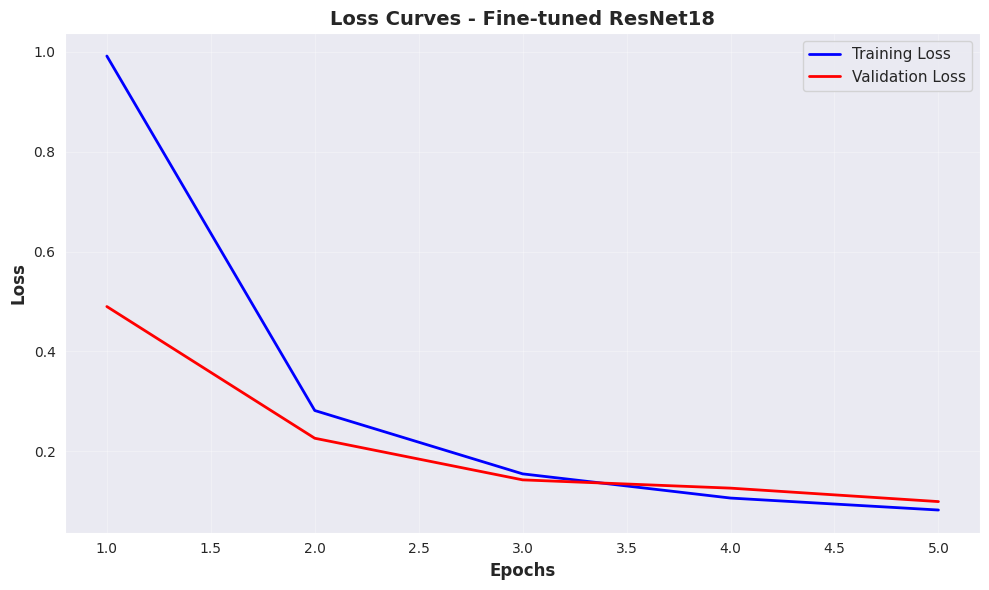

In [ ]:
import matplotlib.pyplot as plt

train_loss = history_finetune['train_loss']
val_loss = history_finetune['val_loss']
epochs_range = range(1, len(train_loss) + 1)

plt.figure(figsize=(10, 6))
plt.plot(epochs_range, train_loss, 'b-', label='Training Loss', linewidth=2)
plt.plot(epochs_range, val_loss, 'r-', label='Validation Loss', linewidth=2)
plt.xlabel('Epochs', fontsize=12, fontweight='bold')
plt.ylabel('Loss', fontsize=12, fontweight='bold')
plt.title('Loss Curves - Fine-tuned ResNet18', fontsize=14, fontweight='bold')
plt.legend(fontsize=11)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('/content/loss_curves.png', dpi=300, bbox_inches='tight')
plt.show()


# **Learning Curves (Accuracy)**

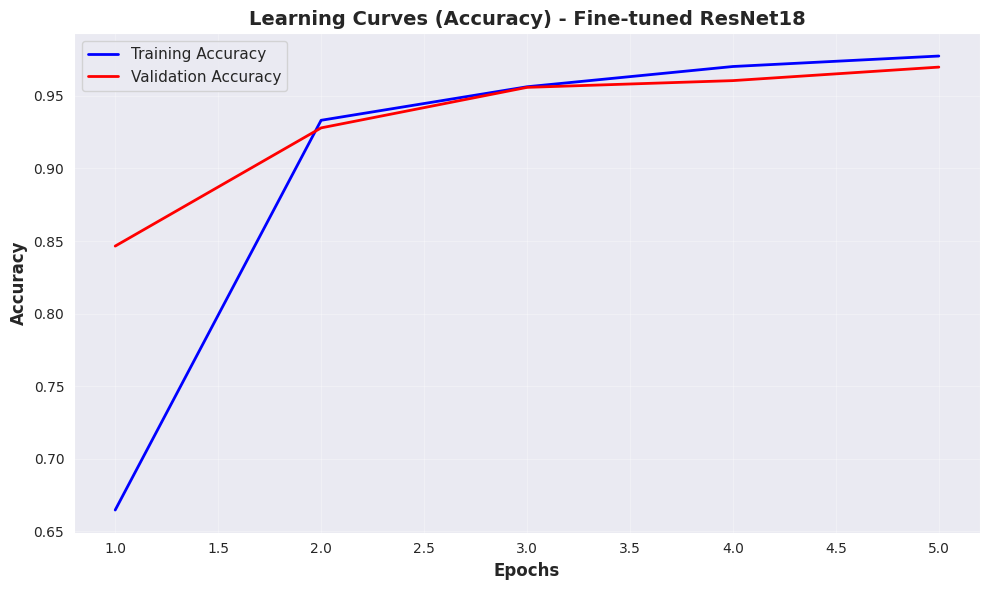

In [ ]:
train_acc = history_finetune['train_acc']
val_acc = history_finetune['val_acc']

plt.figure(figsize=(10, 6))
plt.plot(epochs_range, train_acc, 'b-', label='Training Accuracy', linewidth=2)
plt.plot(epochs_range, val_acc, 'r-', label='Validation Accuracy', linewidth=2)
plt.xlabel('Epochs', fontsize=12, fontweight='bold')
plt.ylabel('Accuracy', fontsize=12, fontweight='bold')
plt.title('Learning Curves (Accuracy) - Fine-tuned ResNet18', fontsize=14, fontweight='bold')
plt.legend(fontsize=11)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('/content/learning_curves.png', dpi=300, bbox_inches='tight')
plt.show()


# **Training Curves (Loss)**

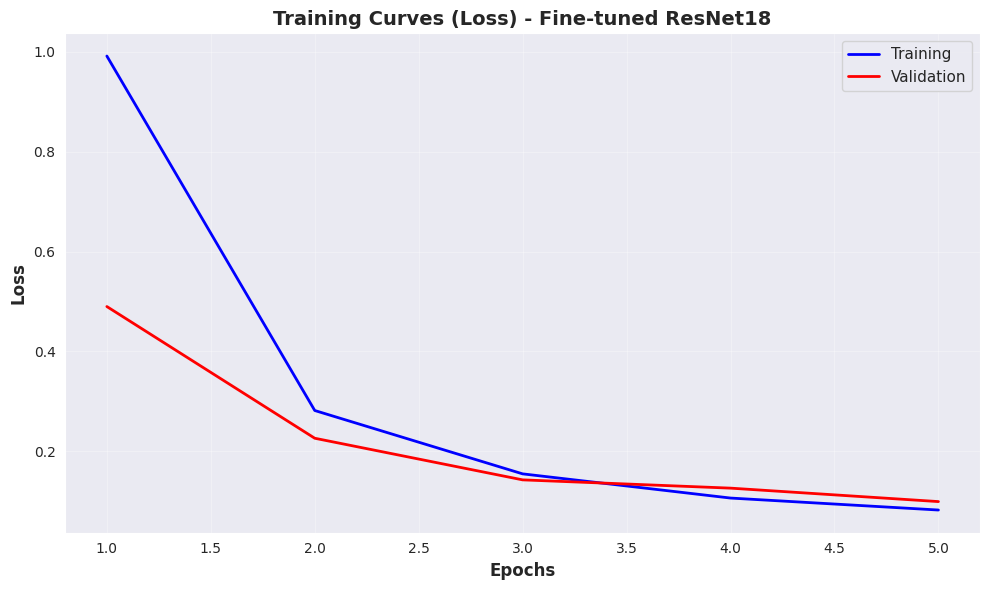

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(epochs_range, train_loss, 'b-', label='Training', linewidth=2)
plt.plot(epochs_range, val_loss, 'r-', label='Validation', linewidth=2)
plt.xlabel('Epochs', fontsize=12, fontweight='bold')
plt.ylabel('Loss', fontsize=12, fontweight='bold')
plt.title('Training Curves (Loss) - Fine-tuned ResNet18', fontsize=14, fontweight='bold')
plt.legend(fontsize=11)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('/content/training_curves_loss.png', dpi=300, bbox_inches='tight')
plt.show()


# **Confusion Matrix**

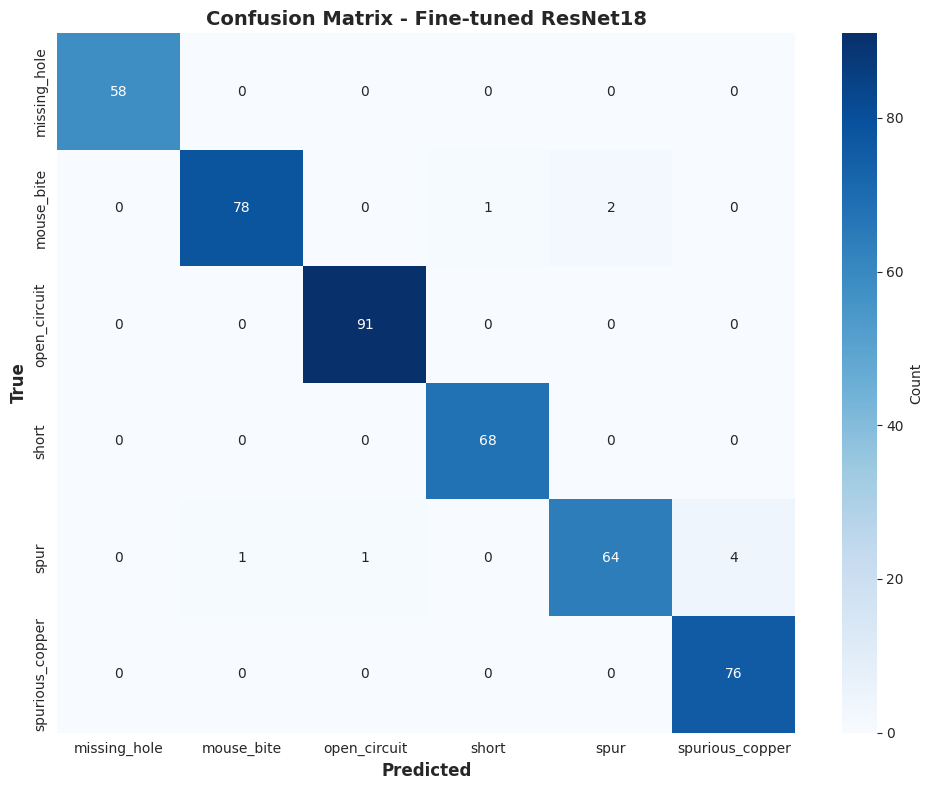

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import numpy as np

best_finetune_model.eval()
all_preds = []
all_labels = []

with torch.no_grad():
    for inputs, labels in dataloaders['test']:
        outputs = best_finetune_model(inputs.to(device))
        _, preds = torch.max(outputs, 1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.numpy())

cm = confusion_matrix(all_labels, all_preds)

plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names,
            cbar_kws={'label': 'Count'})
plt.xlabel('Predicted', fontsize=12, fontweight='bold')
plt.ylabel('True', fontsize=12, fontweight='bold')
plt.title('Confusion Matrix - Fine-tuned ResNet18', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('/content/confusion_matrix.png', dpi=300, bbox_inches='tight')
plt.show()


# **ROC Curves (Multi-class)**

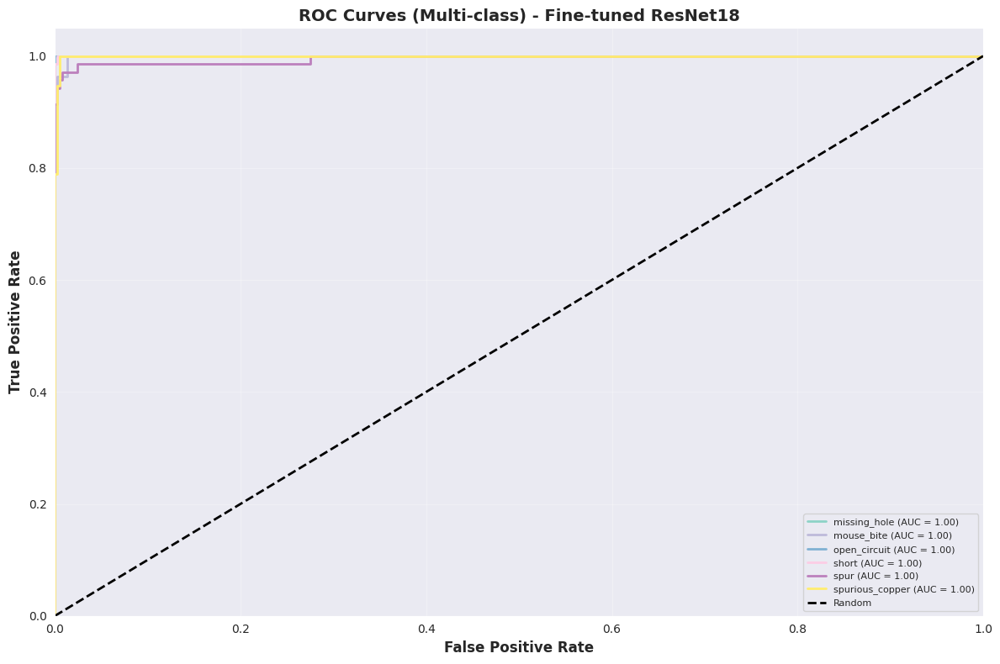

In [ ]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

best_finetune_model.eval()
all_preds = []
all_labels = []
all_probs = []

with torch.no_grad():
    for inputs, labels in dataloaders['test']:
        outputs = best_finetune_model(inputs.to(device))
        probs = torch.softmax(outputs, dim=1)
        _, preds = torch.max(outputs, 1)
        all_preds.extend(preds.cpu().numpy())
        all_probs.extend(probs.cpu().numpy())
        all_labels.extend(labels.numpy())

all_probs = np.array(all_probs)
n_classes = len(class_names)
y_test_bin = label_binarize(all_labels, classes=range(n_classes))

fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], all_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

plt.figure(figsize=(12, 8))
colors = plt.cm.Set3(np.linspace(0, 1, n_classes))

for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
            label=f'{class_names[i]} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Random')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=12, fontweight='bold')
plt.ylabel('True Positive Rate', fontsize=12, fontweight='bold')
plt.title('ROC Curves (Multi-class) - Fine-tuned ResNet18', fontsize=14, fontweight='bold')
plt.legend(loc="lower right", fontsize=8)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('/content/roc_curves.png', dpi=300, bbox_inches='tight')
plt.show()

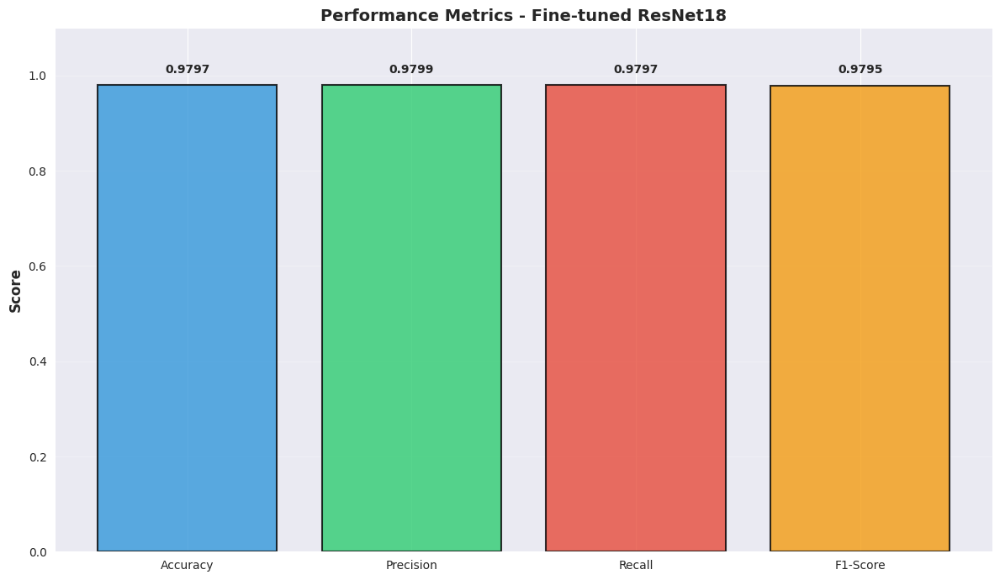

\ All plots saved!


In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

accuracy = accuracy_score(all_labels, all_preds)
precision = precision_score(all_labels, all_preds, average='weighted')
recall = recall_score(all_labels, all_preds, average='weighted')
f1 = f1_score(all_labels, all_preds, average='weighted')

metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score']
values = [accuracy, precision, recall, f1]
colors_bar = ['#3498db', '#2ecc71', '#e74c3c', '#f39c12']

plt.figure(figsize=(12, 7))
bars = plt.bar(metrics, values, color=colors_bar, alpha=0.8, edgecolor='black', linewidth=1.5)
plt.ylim([0, 1.1])
plt.ylabel('Score', fontsize=12, fontweight='bold')
plt.title('Performance Metrics - Fine-tuned ResNet18', fontsize=14, fontweight='bold')
plt.grid(axis='y', alpha=0.3)

for bar, value in zip(bars, values):
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height + 0.02,
            f'{value:.4f}', ha='center', va='bottom', fontsize=10, fontweight='bold')

plt.tight_layout()
plt.savefig('/content/performance_metrics.png', dpi=300, bbox_inches='tight')
plt.show()

print("\ All plots saved!")
